#  Stable Diffusion 1.4 Cuda Version

In [1]:
#install the diffuser package
#pip install --upgrade pip
!pip install --upgrade diffusers transformers scipy

  Using cached diffusers-0.11.1-py3-none-any.whl (524 kB)
  Using cached transformers-4.25.1-py3-none-any.whl (5.8 MB)
  Attempting uninstall: transformers
    Found existing installation: transformers 4.20.1
    Uninstalling transformers-4.20.1:
      Successfully uninstalled transformers-4.20.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
allennlp 2.10.1 requires transformers<4.21,>=4.1, but you have transformers 4.25.1 which is incompatible.


In [3]:
#load the model from stable-diffusion model card
import torch
from diffusers import StableDiffusionPipeline

model_id = "CompVis/stable-diffusion-v1-4"
device = "cuda"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to(device)


Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/313 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/592 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/492M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/806 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/743 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/522 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [4]:
%%time
#Provide the Keywords 
prompts = [
    "a couple holding hands with plants growing out of their heads, growth of a couple, rainy day, atmospheric, bokeh matte masterpiece by artgerm by wlop by alphonse muhca ",
    "detailed portrait beautiful Neon Operator Girl, cyberpunk futuristic neon, reflective puffy coat, decorated with traditional Japanese ornaments by Ismail inceoglu dragan bibin hans thoma greg rutkowski Alexandros Pyromallis Nekro Rene Maritte Illustrated, Perfect face, fine details, realistic shaded, fine-face, pretty face",
    "symmetry!! portrait of minotaur, sci - fi, glowing lights!! intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha, 8 k ",
    "Human, Simon Stalenhag in forest clearing style, trends on artstation, artstation HD, artstation, unreal engine, 4k, 8k",
    "portrait of a young ruggedly handsome but joyful pirate, male, masculine, upper body, red hair, long hair, d & d, fantasy, roguish smirk, intricate, elegant, highly detailed, digital painting, artstation, concept art, matte, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha ",
    "Symmetry!! portrait of a sith lord, warrior in sci-fi armour, tech wear, muscular!! sci-fi, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha",
    "highly detailed portrait of a cat knight wearing heavy armor, stephen bliss, unreal engine, greg rutkowski, loish, rhads, beeple, makoto shinkai and lois van baarle, ilya kuvshinov, rossdraws, tom bagshaw, tom whalen, alphonse mucha, global illumination, god rays, detailed and intricate environment ",
    "black and white portrait photo, the most beautiful girl in the world, earth, year 2447, cdx"
]


CPU times: user 12 µs, sys: 2 µs, total: 14 µs
Wall time: 17.9 µs


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 1min 21s, sys: 13.7 s, total: 1min 35s
Wall time: 1min 39s


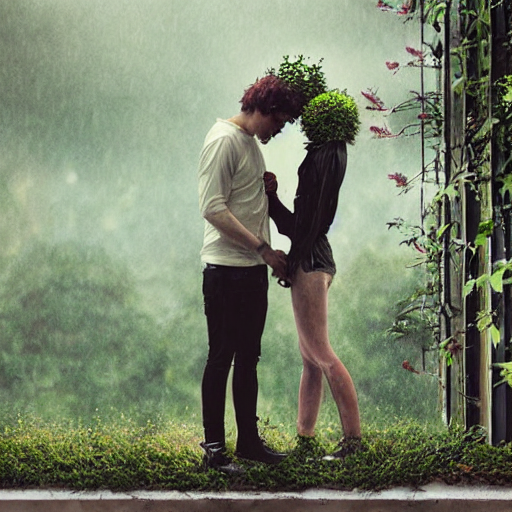

In [5]:
%%time
#show the results
images = pipe(prompts).images 
images

#show a single result
images[0]

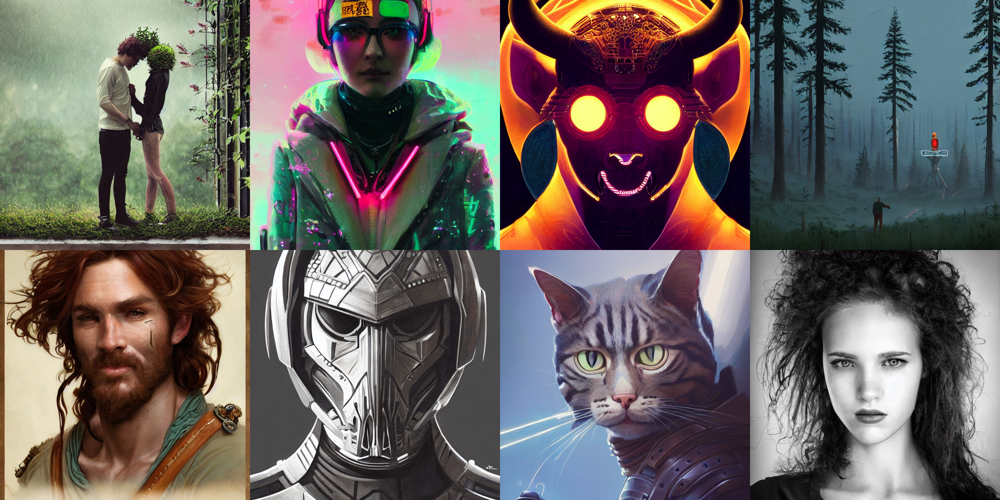

In [6]:
#show the results in grid
from PIL import Image
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

grid = image_grid(images, rows=2, cols=4)
grid

In [7]:
#Save the results
grid.save("result_images.png")

Note: If you are limited by GPU memory and have less than 4GB of GPU RAM available, please make sure to load the StableDiffusionPipeline in float16 precision instead of the default float32 precision as done above. You can do so by telling diffusers to expect the weights to be in float16 precision:

In [8]:
%%time
import torch
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to(device)
pipe.enable_attention_slicing()

images2 = pipe(prompts)
images2[0]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 1min 17s, sys: 32.6 s, total: 1min 50s
Wall time: 2min 27s


[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

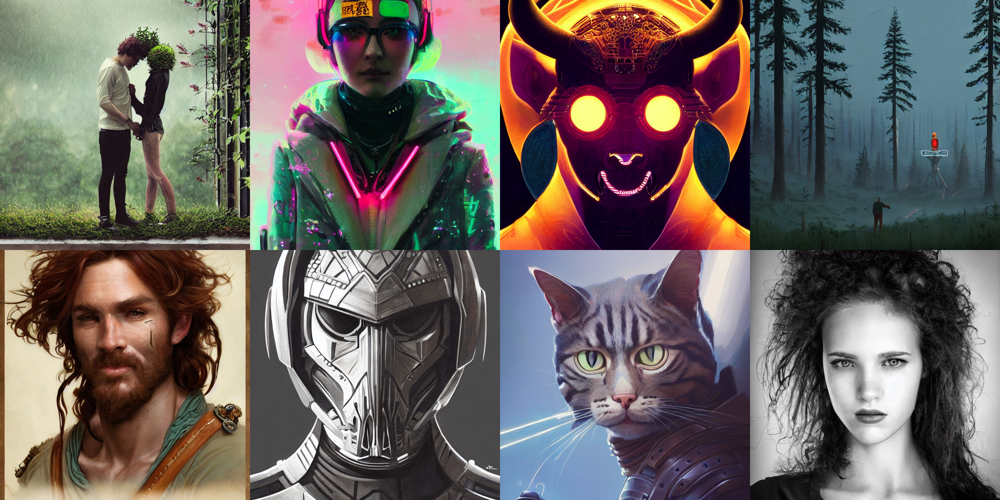

In [9]:
grid2 = image_grid(images, rows=2, cols=4)
grid2

To swap out the noise scheduler, pass it to from_pretrained:

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 1min 22s, sys: 18.3 s, total: 1min 40s
Wall time: 2min 15s


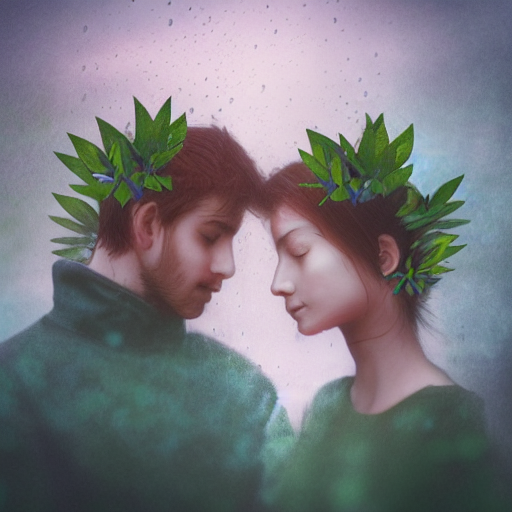

In [10]:
%%time
from diffusers import StableDiffusionPipeline, EulerDiscreteScheduler

model_id = "CompVis/stable-diffusion-v1-4"

# Use the Euler scheduler here instead
scheduler = EulerDiscreteScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

images3 = pipe(prompts)
images3[0][0]

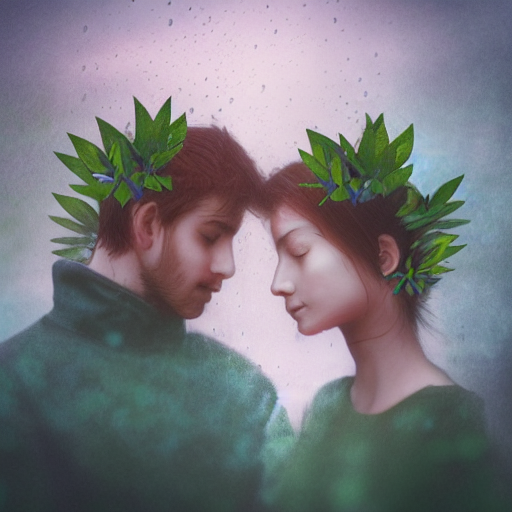

In [11]:
#results are saved in tuple
images3[0][0]

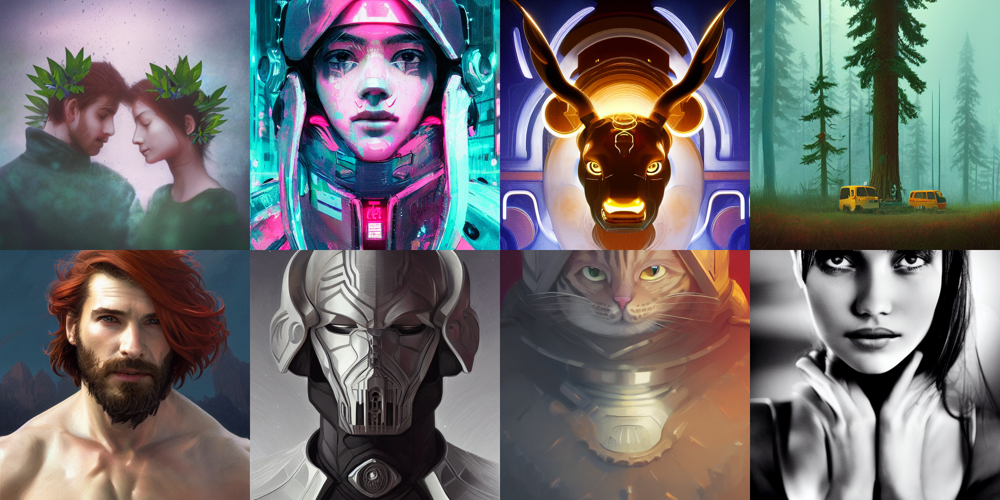

In [12]:
grid3 = image_grid(images3[0], rows=2, cols=4)
grid3

In [ ]:
#save the final output
grid3.save("results_stable_diffusionv1.4.png")